# Homework 1
 
This homework will explore some basic techniques presented in the first two weeks of the course.
 
You will be invited to experiment with:
 
 1. Word Frequencies and Generation
 2. Co-occurrences
 2. Zipf's law
 2. Naive Bayes classifier
 
 
Fill in the blanks with your own code and see how it works.
 
# 1. Word Frequencies

In [1]:
import nltk
import random

nltk.download('brown')

from nltk.corpus import brown

[nltk_data] Downloading package brown to /home/vincentkun/nltk_data...
[nltk_data]   Package brown is already up-to-date!


Get the list of words of documents in the category `news`.

In [2]:

brown_news = brown.words(categories='news')


# to lower case?
brown_news = [word.lower() for word in brown_news]

In [3]:
print(brown_news)

['the', 'fulton', 'county', 'grand', 'jury', 'said', 'friday', 'an', 'investigation', 'of', "atlanta's", 'recent', 'primary', 'election', 'produced', '``', 'no', 'evidence', "''", 'that', 'any', 'irregularities', 'took', 'place', '.', 'the', 'jury', 'further', 'said', 'in', 'term-end', 'presentments', 'that', 'the', 'city', 'executive', 'committee', ',', 'which', 'had', 'over-all', 'charge', 'of', 'the', 'election', ',', '``', 'deserves', 'the', 'praise', 'and', 'thanks', 'of', 'the', 'city', 'of', 'atlanta', "''", 'for', 'the', 'manner', 'in', 'which', 'the', 'election', 'was', 'conducted', '.', 'the', 'september-october', 'term', 'jury', 'had', 'been', 'charged', 'by', 'fulton', 'superior', 'court', 'judge', 'durwood', 'pye', 'to', 'investigate', 'reports', 'of', 'possible', '``', 'irregularities', "''", 'in', 'the', 'hard-fought', 'primary', 'which', 'was', 'won', 'by', 'mayor-nominate', 'ivan', 'allen', 'jr.', '.', '``', 'only', 'a', 'relative', 'handful', 'of', 'such', 'reports', 

Compute the frequencies for all words

In [4]:

# this should be a dictionary with frequency counts for each word

def f(number_word):
    return number_word / len(brown_news)

news_freq = {}

for word in brown_news:
    
    # get metod add 1 for each time see that word 
    news_freq[word] = news_freq.get(word, 0) + 1
     
#dict = {k: f(v) for k, v in news_freq.items()} 
 



Compute a probability distribution of all words from `news_freq`, sorted by decreasing probability.

In [5]:
# probability distribution for all words
news_prob = {k: f(v) for k, v in news_freq.items()}

# order the dictionary by value
news_prob = sorted(news_prob.items(), key=lambda x: x[1], reverse=True)

print(news_prob)

[('the', 0.06350816476718976), (',', 0.05159416830757603), ('.', 0.04007796805696442), ('of', 0.02845237384887722), ('and', 0.021739562821966308), ('to', 0.021321876802514073), ('a', 0.021182648129363327), ('in', 0.020088708554607475), ('for', 0.009636613163076556), ('that', 0.008244326431569107), ('is', 0.007289615529963999), ('``', 0.007279670624738947), ('was', 0.007130497046363148), ("''", 0.0069813234679873505), ('on', 0.0068719295105117645), ('he', 0.006384629154484157), ('at', 0.006324959723133838), ('with', 0.005638761262605168), ('be', 0.0052310201483779855), ('as', 0.005141516001352507), ('by', 0.005012232233426815), ('it', 0.004753664697575432), ('his', 0.004256419436322772), ('said', 0.004037631521371601), ('will', 0.003868568132545697), ('from', 0.0035105515444437815), ('are', 0.0032818187242675575), ('this', 0.003182369672017026), (';', 0.0031227002406667066), ('an', 0.003092865524991547), ('has', 0.0029934164727410148), ('--', 0.0029834715675159614), ('but', 0.0028144081

Define a function which returns a random word according to the above probability distribution. <p>
Hint: use function `random.random` to obtain a random number in the range `[0, 1]` and scan the probabilities from highest to lowest.

In [6]:
def sample(prob_dist):

    # get a random number between 0 and 1
    r = random.random()
    
    for word, prob in prob_dist:
        if r < prob:
            return word
        else:
            # to scan for the right word probability
            r -= prob
      
print(sample(news_prob))  
    
    



special


# 2. Co-occurrences

Extract the vocabulary and assign an index to each word.

In [7]:
# this should be a set
news_vocab = {word for word in brown_news}

# this should be a dictionary that assigns an index to each word
news_word_ids = {word: i for i, word in enumerate(news_vocab)}


## 2.1 Compute co-occurrence Matrix
Constructs a co-occurrence matrix for a certain window-size $n$ (with a default of
4), considering words $n$ before and $n$ after the word in the center of the window.

In [35]:
import numpy as np
import pandas as pd

def co_occurrence_matrix(words, word_ids, n=4):
    """
    :param words: a list of words
    :param word_ids: dictionary word -> id
    :param n: size of context
    :return: the matrix of cooccurrences
    """
    # your code here
    
    # create a matrix with zeros
    M = np.zeros((len(word_ids), len(word_ids)))
    
    for word in words:

        #get index of current word        
        i = word_ids[word]

        # get the context of the word
        context = words[max(0,i-n):i] + words[i+1:i+n]

        # WORDS IN CONTEXT
        print(context)
        print("word: ", word)
        
        for c in context:

            j = word_ids[c]
            
            M[i,j] += 1        
    
    return M



In [37]:
import numpy as np

def co_occurrence_matrix_2(words, word_ids, n=4):
    """
    :param words: a list of words
    :param word_ids: dictionary word -> id
    :param n: size of context
    :return: the matrix of cooccurrences
    """
    V_size = len(word_ids)
    M = np.zeros((V_size, V_size), dtype=int)

    # sliding window through the corpus
    for i in range(len(words)):
        center_word = word_ids[words[i]]
        for word in words[max(0,i-n):i] + words[i+1:i+n+1]:

            print("word in context: ", word)
            
            # increment the cooccurrence counts
            M[center_word, word_ids[word]] += 1
    return M

In [36]:
M = co_occurrence_matrix_2(brown_news, news_word_ids, 5)

#pritn where M is not zero
print(np.nonzero(M))



['these', ',', 'he', 'said', ',', '``', 'two', 'of', 'the']
word:  the
['to', 'be', 'supported', 'and', 'assisted', 'a', 'citizens', 'advisory', 'council']
word:  fulton
['.', '``', 'you', 'take', 'out', 'circulation', 'many', 'millions', 'of']
word:  county
['el', 'paso', ',', 'to', 'acquire', 'for', 'underground', 'storage', 'reservoirs']
word:  grand
['was', 'absorbed', ',', 'parkhouse', 'told', 'senate', '.', 'the', 'tea']
word:  jury
['aid', 'training', 'for', 'section', 'wardens', 'he', 'is', 'credited', 'with']
word:  said
['may', 'merely', 'mean', 'the', 'new', 'has', 'not', 'yet', 'firmly']
word:  friday
['to', 'pay', 'for', 'other', 'social', 'costs', '.', 'outlays', 'would']
word:  an
['its', 'original', 'program', 'has', 'come', 'pass', 'under', 'both', 'major']
word:  investigation
['and', 'dentistry', 'because', 'they', "can't", 'the', 'schooling', 'costs', '.']
word:  of
['with', 'mr.', "nugent's", 'cooperation', ',', 'governor', 'said', '.', '``']
word:  atlanta's
['a',

### Explore co-occurences

In [11]:
def show_cooccurrences(word_list, word_ids, M):
    """
    :param word_list: the list of words whose co-occurrences to show
    :param word_ids: dictionary assigning ID's to words
    :param M: the co-occurrence matrix
    """
    # print the top 10 most co-occurring words for each word in word_list

    collection_idx = []

    for word in word_list:
        
        word_idx = word_ids.get(word, 0)

        if word_idx == 0:
            print("Word not in vocabulary")
            # do not add to collection
        else:
            collection_idx.append(word_idx)
        
    
    for indexes in collection_idx:
        
        co_counts = M[indexes]
        
        sorted_indexes = np.argsort(co_counts)[::-1]
        
        sorted_indexes = sorted_indexes[1:11]
        
        # print number of co occurrences
        #print("Co occurrences for word:", word,"are: ", sorted_indexes) 
        
        list_of_co_occurrences = [list(word_ids.keys())[list(word_ids.values()).index(i)] for i in sorted_indexes]

        #print("Co occurrences for word:", word,"are: ", list_of_co_occurrences)

        # get word from indexes
        word = list(word_ids.keys())[list(word_ids.values()).index(indexes)]

        print("Co occurrences for word:", word,"are: ", list_of_co_occurrences)
     

In [12]:
def show_cooccurrences_2(word_list, word_ids, M):
    """
    :param word_list: the list of words whose co-occurrences to show
    :param word_ids: dictionary assigning ID's to words
    :param M: the co-occurrence matrix
    """
    for word in word_list:
        if word in word_ids:
            word_id = word_ids[word]
            co_occurences = [(coword, M[word_id, coid]) for (coword, coid) in word_ids.items() ]
            # sort by co-occurrence counts
            co_occurences.sort(key=lambda pair: pair[1], reverse=True)
            print(f'Co-occurrences for word "{word}":')
            print([pair for pair in co_occurences[:10] if pair[1]])   # shorten output
            print()
        else:
            print(f'The word "{word}" does not exist in the vocabulary.')
            print()

In [13]:
word_list = ['python', 'snake', 'language', 'cobra', 'food', 'bread', 'wine', 'beer',
             'barrels', 'oil', 'energy', 'kuwait', 'revenues', 'profits']
    


In [27]:
show_cooccurrences(word_list, news_word_ids, M)



Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Co occurrences for word: snake are:  ['hearings', 'jury', 'admitted', 'that', 'wexler', 'court', 'he', 'in', 'home-run', 'perfection']
Co occurrences for word: language are:  ['noticeable', 'of', '.', 'there', 'tension', 'been', 'has', 'a', "mickey's", 'perfection']
Co occurrences for word: food are:  ['earned', 'university', 'the', 'of', 'holds', 'degree', 'an', 'doctor', 'lag', 'thursday']
Co occurrences for word: bread are:  ['civil', 'will', 'organization', 'so', 'september', 'in', 'defense', 'early', 'lag', 'chemistry']
Co occurrences for word: beer are:  ['jury', '.', 'did', 'before', 'take', 'mayer', 'not', 'grand', 'robinson', 'columnist']
Co occurrences for word: oil are:  ['who', 'on', 'guilty', 'motorists', 'new', 'ordinance', 'a', 'action', 'home-run', 'scoring']
Co occurrences for word: energy are:  ['said', 'be', 'proud', 'was', 'republican', 'he', 'an', 'lab

### Do the same for category ‘hobbies’.

In [15]:
brown_hobbies = brown.words(categories='hobbies')
#to lower case

brown_hobbies = [word.lower() for word in brown_hobbies]
hobbies_vocab = {word for word in brown_hobbies} # ...

hobbies_word_ids = {word: i for i, word in enumerate(hobbies_vocab)}
M_hobbies = co_occurrence_matrix(brown_hobbies, hobbies_word_ids, 5)

show_cooccurrences(word_list, hobbies_word_ids, M_hobbies)

Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Co occurrences for word: food are:  ['pin', 'bobby', 'separate', 'to', 'using', 'a', 'earth', 'the', 'pulsating', 'knackwurst']
Co occurrences for word: bread are:  ['is', 'the', 'greatness', 'fact', 'its', 'no', 'diminished', 'serious-minded', 'chemistry', 'divisions']
Co occurrences for word: wine are:  ['after', 'have', 'gotta', '?', 'little', ',', 'all', 'pulsating', 'occurs', 'thursday']
Co occurrences for word: beer are:  ['an', 'much', 'egg', 'is', 'it', 'thick', ',', "plant's", 'divisions', 'towns']
Co occurrences for word: barrels are:  ['them', 'once', 'can', '.', 'this', 'use', 'is', 'if', 'terry', 'chemistry']
Co occurrences for word: oil are:  ['of', 'been', 'as', 'has', 'finals', 'class', 'junior', 'pulsating', 'thursday', 'dimensionally']
Co occurrences for word: energy are:  ['of', 'essential', '.', 'attitude', 'right', 'photographers

## 2.2 Visualize the Vectors
Projects vectors into two dimensions and use it to plot the rows of the sliced matrix, using the technique of Principal
Component Analysis,

In [16]:
from sklearn.decomposition import PCA
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')

def visualize_vectors(words, word_vectors):
    """
    Plot a 2 dimensional visualization of word vectors.
    :param words: the words to visualize
    :param word_vectors: the vectors for those words
    """
    vector_twodim = PCA().fit_transform(word_vectors)[:,:2]
    # show the numerical values of reduced vectors
    for w,v in zip(words, vector_twodim):
        print(w, v)

    plt.figure(figsize=(8,8))
    plt.scatter(vector_twodim[:,0], vector_twodim[:,1], edgecolors='k', c='r')
    for word, (x,y) in zip(words, vector_twodim):
        plt.text(x+0.05, y+0.05, word)

Extract the co-occurrence vectors for a given list of words

In [17]:
def cooccurrence_vectors(word_list, word_ids, M):
    """
    :param word_list: a list of words
    :param word_ids: dictionary of word IDs
    :param M: co-occurrence matrix
    :return: tow results: the vectors for the given words as well as word_list 
    """
    vectors = []
    word_lists = []

    for word in word_list:
        
        word_idx = word_ids.get(word, 0)

        if word_idx == 0:
            print("Word not in vocabulary")
            # do not add to collection
        else:
            vectors.append(M[word_idx])
            word_lists.append(word)
        
            
    # ...
    return vectors, word_lists

Visualize the co-occurrence vectors for the given words:

Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
snake [-5.51174112 -0.40476153]
language [-3.64351408 -0.89244406]
food [12.7892202  -8.90928921]
bread [-5.4319835  -0.57299699]
beer [-4.53289781  0.37098584]
oil [ 3.30159195 -1.41396698]
energy [-5.48445379  0.39207083]
revenues [11.96781838  9.94232459]
profits [-3.45404024  1.48807752]


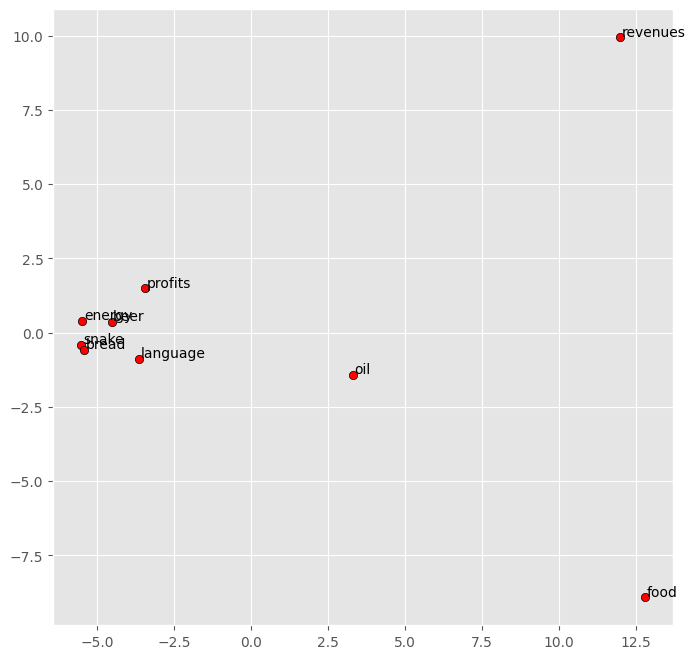

In [18]:

word_vectors, words = cooccurrence_vectors(word_list, news_word_ids, M)

visualize_vectors(words, word_vectors)

Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
Word not in vocabulary
snake [-8.90141942 25.09104644]
language [-12.70699601  -4.14384474]
food [-13.93639198  -3.10867951]
bread [-13.89349745  -4.57422178]
beer [-13.89420422  -4.61361405]
oil [82.26796214 -0.94596815]
energy [-5.1033535  -3.32667005]
revenues [-13.83209956  -4.37804817]


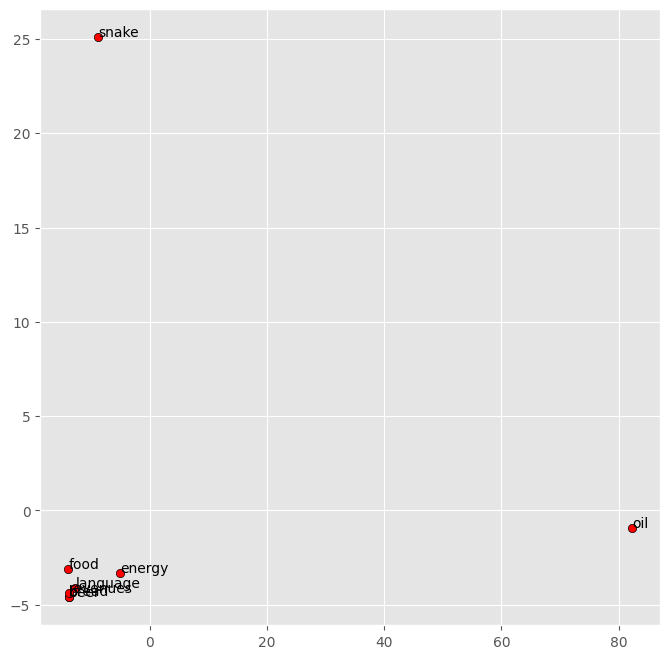

In [19]:
word_vectors, wordsw = cooccurrence_vectors(word_list, hobbies_word_ids, M_hobbies)
visualize_vectors(words, word_vectors)

# 3. Zipf's Law

First define two functions, one to tokenize text from a .txt file and another to extract the vocabulary and compute the number of occurrences of each word.

In [20]:
def tokenize_from_txt(file_name):
    import nltk
    from nltk import word_tokenize
    from nltk import sent_tokenize
    nltk.download('punkt')
    
    #with open(file_name) as f:
   
    #    txt = f.readlines()
    #    txt = [word.lower() for word in txt]
    #    # delete \n
    #    txt = [word.replace('\n', '') for word in txt]  
    ##
    #words = word_tokenize(txt)
    ##use split for tokenization
    ##words = txt.split()
    #
    ##words = [word.lower() for word in txt]
    words = []

    with open(file_name, "r") as file:
        text = file.read()
        
    tokens = nltk.word_tokenize(text)    

    for word in tokens:
        words.append(word.lower())    
    
    return words

def count_words(words):
    """ Return a dictionary of each word and how many times it occurs in the list of words. """
    vocab = dict()
     
    # for each word in the list of words
    # if there is a key in the dictionary with the same name as the word
    # then increment the value of that key by 1
    # otherwise, add a new key to the dictionary with the word as the key and 1 as the value
    for word in words:
        if word in vocab:
            vocab[word] += 1
        else:
            vocab[word] = 1

    return vocab

Extract the vocabulary and the number of occurrences of each word in it and plot the rank. Then fit the power law distribution to the data to extract the exponent alpha of the power law distribution and use it to estimate the exponent beta of the Zipf's law that approsimate the data.
Zipf's law:

$X[r] = C*r^{-\beta}$

where r is the rank and C a constant. The estimation of C should be equal to the number of occurrences in of the most frequent word but it's easy to see that a bigger value is needed to better fit the Zipf's law.

Regardless of the constant C the plot shows that the rank distribution is well approximated by the Zip's law.

You may want to use the package powerlaw to fit the \alpha to the data, from which to compute:
$$\beta = 1/(\alpha - 1)$$

See: https://github.com/jeffalstott/powerlaw.

[nltk_data] Downloading package punkt to /home/vincentkun/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Calculating best minimal value for power law fit


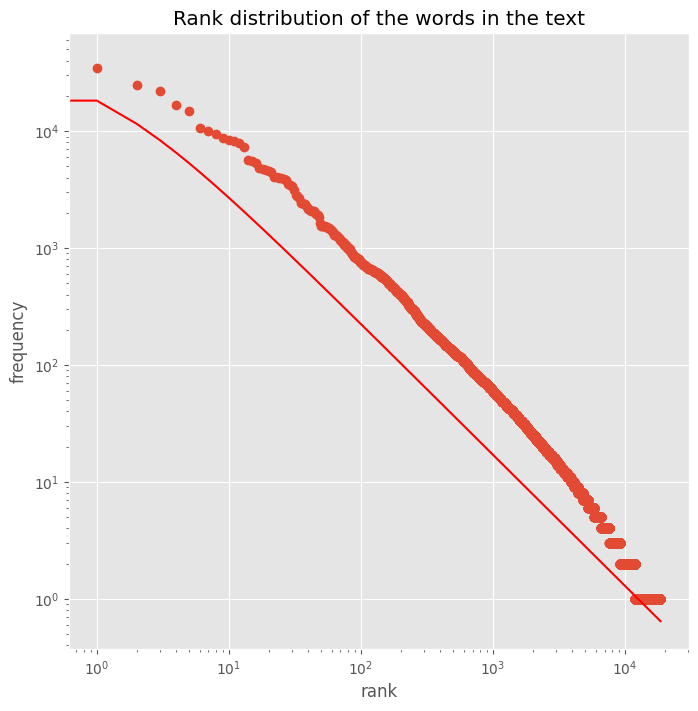

In [21]:
%matplotlib inline

import matplotlib.pyplot as plt

file_name = 'book-war-and-peace.txt'

tokenized_text = tokenize_from_txt(file_name)

vocab = count_words(tokenized_text)

# extracting rank distribution of the words
rank_distribution = list(vocab.values())
rank_distribution.sort(reverse=True)

# fitting of the power law distribution and estimation of the exponent of the Zip's law

import powerlaw 
from powerlaw import Fit

pl_fit = powerlaw.Fit(rank_distribution)

alpha = pl_fit.alpha
beta = 1/(alpha-1)
C = rank_distribution[0]

zipf_counts = [C * (rank**(-beta)) for rank in range(1, len(rank_distribution)+1)]

plt.figure(figsize=(8,8))

# plot the rank distribution on a log-log scale
plt.loglog(rank_distribution, 'o')
# plot the Zipf's law on the log-log scale
plt.loglog(zipf_counts, 'r-')

plt.xlabel('rank')
plt.ylabel('frequency')
plt.title('Rank distribution of the words in the text')
plt.show()


# ...
# plot the Zipf's law and the rank distribution on a log-log scale
# ...

# 4. Naïve Bayes Classifier
We will use the Movie Review dataset from https://www.kaggle.com/pankrzysiu/keras-imdb
It contains 50,000 highly polarized reviews, preprocessed, tokenized, indexed and stored into
numpy arrays.

In [3]:
num_words = 10000
MAX_NUM_WORDS = 10000

from tensorflow.keras.datasets import imdb

2023-03-15 15:55:28.661915: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-15 15:55:29.374745: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-03-15 15:55:29.374787: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-03-15 15:55:32.494838: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-

Load the training and test set:

In [4]:
(x_train, y_train), (x_test, y_test) = imdb.load_data(num_words=MAX_NUM_WORDS,
                                                     index_from=1)

Each document is represented as a list of word IDs, while the output is {0,1} (negative or positive review)

In [6]:
# given all these ids we have that is 0 : negative

x_train[1], y_train[1]

print(x_train)

[list([1, 12, 20, 14, 41, 528, 971, 1620, 1383, 63, 456, 4466, 64, 3939, 2, 171, 34, 254, 3, 23, 98, 41, 836, 110, 48, 668, 2, 7, 33, 478, 282, 3, 148, 2, 170, 110, 165, 2, 334, 383, 37, 2, 170, 4534, 1109, 15, 544, 36, 11, 445, 2, 190, 48, 14, 4, 145, 2023, 17, 12, 20, 2, 1918, 4611, 467, 2, 20, 69, 85, 10, 14, 41, 528, 36, 74, 13, 11, 1245, 2, 20, 15, 513, 15, 10, 14, 624, 16, 2, 3, 60, 384, 10, 6, 314, 6, 104, 3, 2, 2221, 5242, 14, 478, 64, 3783, 31, 2, 128, 10, 14, 36, 617, 3, 23, 122, 49, 34, 133, 46, 23, 1413, 31, 4, 20, 10, 213, 26, 75, 50, 3, 12, 405, 14, 80, 2, 6, 2, 105, 115, 5950, 13, 254, 2, 2, 5, 3764, 3, 721, 34, 69, 41, 528, 474, 24, 398, 315, 44, 5, 2, 2, 1027, 11, 102, 86, 2, 379, 13, 295, 96, 30, 2069, 54, 24, 139, 4, 192, 7484, 16, 2, 224, 20, 19, 132, 474, 24, 478, 3, 142, 28, 5533, 16, 49, 34, 26, 222, 90, 23, 102, 2, 224, 63, 14, 36, 1332, 86, 10, 14, 281, 3, 14, 4470, 111, 101, 30, 13, 14, 5343, 17, 176, 30])
 list([1, 192, 1151, 192, 8253, 76, 226, 3, 4, 1461, 4

## 4.1 Classifier

The classifier should be implemted as a class with two methods: `train()` and `predict()`.

# Naive Bayes:

The classifier is based on the bayes theorem application to our data

## Bayes theorem

$$P(A|B) = \frac{P(B|A)P(A)}{P(B)}$$

So our data are a feature vector $X = (x_1, x_2, ..., x_n)$ and a class $y$.

We have that

$$P(y|X) = \frac{P(X|y)P(y)}{P(X)}$$

- Assuming mutually independent features (they are not): this is the Naivety of this model

$$P(X|y) = \prod_{i=1}^{n}P(x_i|y)$$

The posterior is $P(y|X)$, the probability of the class given the feature vector. And the productory is the likelihood of the feature vector given the class. 
We will get rid of the denominator $P(X)$ because it is the same for all classes and it is not needed to compute the class with the highest probability.

Then our $y$ will become the class with the highest probability

$$y = argmax_y P(y|X) = argmax_y P(X|y)P(y)$$

To avoid underflow we will use the log of the probabilities

$$y = argmax_y log(P(X|y)P(y))$$

$P(y)$ is the prior probability of the class the frequency of each class, and $P(x_i | y)$ is the class conditional probability of the feature $x_i$ given the class $y$. We will model it with a gaussian distribution.


## Training

We want to compute the priors so $P(y)$ for each class. Then we compute the class conditional probability $P(x_i|y)$ for each feature $x_i$ given each class $y$.


## Inference or prediction

We want to compute the posterior probability $P(y|X)$ for each class $y$ given the feature vector $X$.



In [7]:
import numpy as np
from collections import defaultdict

class NBayesClassifier():
    
    def train(self, x_train, y_train):
        """
        :param x_train: an array of list of word IDs
        :param y_train: {0,1} category for the correspoding document
        """
        
        #x_train is an nd.array long 25k examples, each example x_train[0]..[25k] is a sequence of id (words)
        #y_train is an np.array long 25k that for each x_train[0] gives you

        # Computing the prior is easy just the probability of each class in this case
        self.priors = np.bincount(y_train) / len(y_train)
       
        # Computing the conditional probabilities
        # instead requires to count the number of times each word appears in each class     
        self.cond_probs = defaultdict(lambda: np.zeros(MAX_NUM_WORDS))
        
        for x, y in zip(x_train, y_train):
            self.cond_probs[y] += np.bincount(x, minlength=MAX_NUM_WORDS)
            
        
        
    def predict(self, x_test):
        """
        :param x_test: an array of list of word IDs
        :return: the predicted class for each document in :param x_test:.
        """
        
        #nothing
        pass
        
    
        

In [8]:
nb_classifier = NBayesClassifier()
nb_classifier.train(x_train, y_train)


[0.5 0.5]


## 4.2 Evaluation

In [ ]:
def evaluate(y_test, y_pred):
    # compute tp, fp, tn, fn
    tp = 0
    fp = 0
    tn = 0
    fn = 0
    
    for i in range(len(y_test)):
        if y_test[i] == 1 and y_pred[i] == 1:
            tp += 1
    
    for i in range(len(y_test)):
        if y_test[i] == 0 and y_pred[i] == 1:
            fp += 1
    
    for i in range(len(y_test)):
        if y_test[i] == 0 and y_pred[i] == 0:
            tn += 1

    for i in range(len(y_test)):
        if y_test[i] == 1 and y_pred[i] == 0:
            fn += 1
            
    
    accuracy = tp/len(y_test) 
    precision = tp/(tp+fp)
    recall = tp/(tp+fn) 
    F1 = 2*precision*recall/(precision+recall)
    print('Accuracy: %.2f %%, Precision:: %2.f %%, Recall: %2.f %%, F1: %2.f %%' % (accuracy, precision, recall, F1))

In [ ]:
y_pred = nb_classifier.predict(x_test)
evaluate(y_test, y_pred)

Compare with an official metrics:

In [ ]:
evaluate(y_test, y_pred)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))